# Configure Environment

In [19]:
import os

In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

# Load data

In [21]:
cwd = os.getcwd()
pardir = os.path.dirname(os.path.dirname(cwd))
data_folder = os.path.join(pardir,'data')
segm_data_folder = os.path.join(data_folder, 'SegmDataset')
mask_folder = os.path.join(segm_data_folder, 'Mascaras_Javi')
img_folder = os.path.join(segm_data_folder, 'Skynas_classified')
cloud_segmenter_path = os.path.join(data_folder, "MultiUnetJoseBACKUP256weight_10_110_1_100_10.h5")

## Load datasets

In [22]:
class PairLoader:
    def __init__(self, img_dir, mask_dir, img_size = (256, 256), prereduction = None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.img_size = img_size
        self.prereduction = prereduction

    def load_pair(self, names):
        name = names[0]
        namemask = names[1]
        img_path  = tf.strings.join([self.img_dir, "/", name])
        img = tf.io.read_file(img_path)
        img = tf.image.decode_jpeg(img, channels=3)
        if self.prereduction is None:
            img = tf.image.resize(img, self.img_size, method="area")
        else:
            img = tf.image.resize(img, self.prereduction, method="area")
            img = tf.image.resize(img, self.img_size, method="bilinear")
        img = tf.cast(img, tf.float32)
        mask_path = tf.strings.join([self.mask_dir, "/", namemask])
        mask = tf.io.read_file(mask_path)
        mask = tf.image.decode_jpeg(mask, channels=1)
        mask = tf.image.resize(mask, self.img_size, method="nearest")
        mask = tf.cast(mask, tf.int32)
        mask = tf.clip_by_value(mask, 0, 4)
        return img, mask

In [23]:
pairloader = PairLoader(img_folder, mask_folder)

In [24]:
names = sorted(os.listdir(img_folder))
namesmask = sorted(os.listdir(mask_folder))
dataset = tf.data.Dataset.from_tensor_slices(list(zip(names, namesmask)))
dataset = dataset.map(pairloader.load_pair).batch(4)

## Load Models

In [25]:
tf.keras.backend.clear_session()
try:
    cloud_segmenter = tf.keras.models.load_model(cloud_segmenter_path)
except:
    cloud_segmenter = tf.keras.layers.TFSMLayer(cloud_segmenter_path, call_endpoint="serving_default")

# Analyze

In [26]:
NUM_CLASSES = 5
CLASS_NAMES = ["Other", "Cloud-free", "Sun", "Cloud", "Thin cloud"]

## Display images

In [27]:
COLORS = np.array([
    [0.0, 0.0, 0.0],      # 0 Other -> negro
    [0.0, 0.6, 1.0],      # 1 Cloud-free -> azul
    [1.0, 1.0, 0.0],      # 2 Sun -> amarillo
    [1.0, 1.0, 1.0],      # 3 Cloud -> blanco
    [0.7, 0.7, 0.7],      # 4 Thin cloud -> gris
])

cmap = ListedColormap(COLORS)

In [28]:
def plot_sample(img, mask, pred=None):
    """
    img:  [H,W,3] float [0,1]
    mask: [H,W] int {0..4}
    pred: [H,W] int {0..4} o None
    """
    ncols = 3 if pred is not None else 2
    plt.figure(figsize=(5*ncols, 5))

    # Imagen
    plt.subplot(1, ncols, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    # GT
    plt.subplot(1, ncols, 2)
    plt.imshow(mask, cmap=cmap, vmin=0, vmax=NUM_CLASSES-1)
    plt.title("Ground Truth")
    plt.axis("off")

    # Pred
    if pred is not None:
        plt.subplot(1, ncols, 3)
        plt.imshow(pred, cmap=cmap, vmin=0, vmax=NUM_CLASSES-1)
        plt.title("Prediction")
        plt.axis("off")

    # Legend
    handles = [
        plt.Line2D([0], [0], marker='s', linestyle='', color=COLORS[i], label=CLASS_NAMES[i])
        for i in range(NUM_CLASSES)
    ]
    plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc="upper left")

    plt.tight_layout()
    plt.show()


## Compute

In [40]:
EPS = 1e-8

def multiclass_metrics(y_true, y_pred, num_classes=5, ignore_class=None):    
    if y_true.shape.rank == 4:
        y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.int32)
    y_pred_cls = tf.argmax(y_pred, axis=-1, output_type=tf.int32)
    y_true_oh = tf.one_hot(y_true, depth=num_classes, dtype=tf.float32)
    y_pred_oh = tf.one_hot(y_pred_cls, depth=num_classes, dtype=tf.float32)

    valid_mask = tf.ones_like(y_true, dtype=tf.bool)
    if ignore_class is not None:
        valid_mask = tf.not_equal(y_true, ignore_class)
        valid = tf.not_equal(y_true, ignore_class)
        valid = tf.cast(valid, tf.float32)[..., None]
        y_true_oh *= valid
        y_pred_oh *= valid

    tp = tf.reduce_sum(y_true_oh * y_pred_oh, axis=[0,1,2])
    fp = tf.reduce_sum((1 - y_true_oh) * y_pred_oh, axis=[0,1,2])
    fn = tf.reduce_sum(y_true_oh * (1 - y_pred_oh), axis=[0,1,2])

    iou  = (tp + EPS) / (tp + fp + fn + EPS)
    dice = (2*tp + EPS) / (2*tp + fp + fn + EPS)
    prec = (tp + EPS) / (tp + fp + EPS)
    rec  = (tp + EPS) / (tp + fn + EPS)

    cce_per_pixel = tf.keras.losses.sparse_categorical_crossentropy(
        y_true, y_pred, from_logits=False
    )
    cce_per_pixel = tf.where(valid_mask, cce_per_pixel, tf.zeros_like(cce_per_pixel))
    cce_per_class = []
    for k in range(num_classes):
        mk = tf.logical_and(valid_mask, tf.equal(y_true, k))  # [B,H,W]
        mk_f = tf.cast(mk, tf.float32)
        sum_k = tf.reduce_sum(cce_per_pixel * mk_f)
        cnt_k = tf.reduce_sum(mk_f)
        cce_per_class.append(tf.math.divide_no_nan(sum_k, cnt_k))
    cce_per_class = tf.stack(cce_per_class, axis=0)

    return {
        "miou": tf.reduce_mean(iou),
        "mdice": tf.reduce_mean(dice),
        "mprecision": tf.reduce_mean(prec),
        "mrecall": tf.reduce_mean(rec),
        "iou_per_class": iou,
        "dice_per_class": dice,
        "cce_per_class": cce_per_class,
        "precision_per_class": prec,
        "recall_per_class": rec,
    }

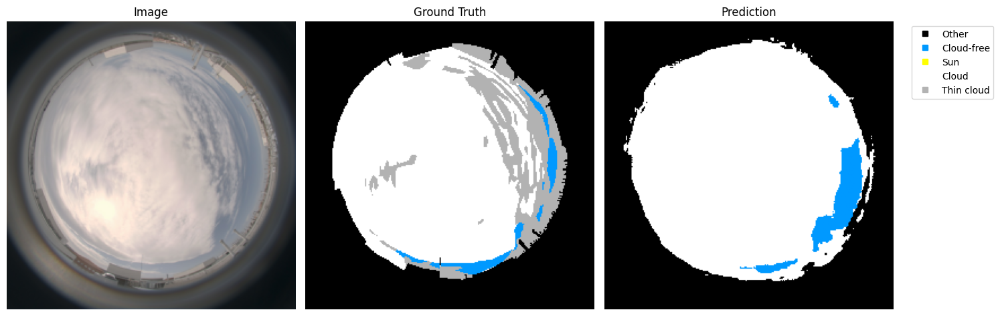

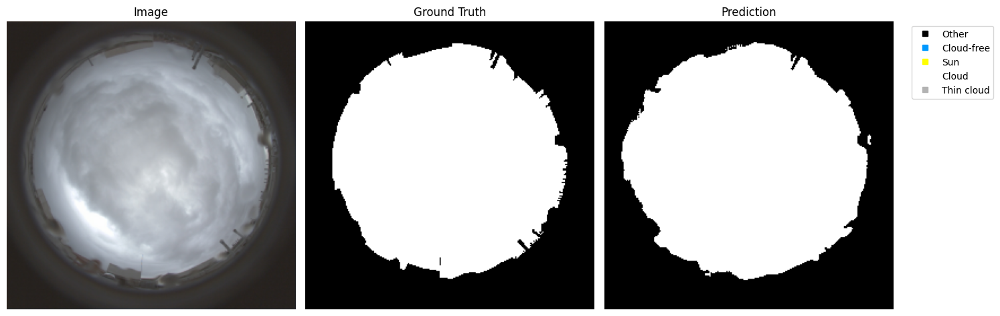

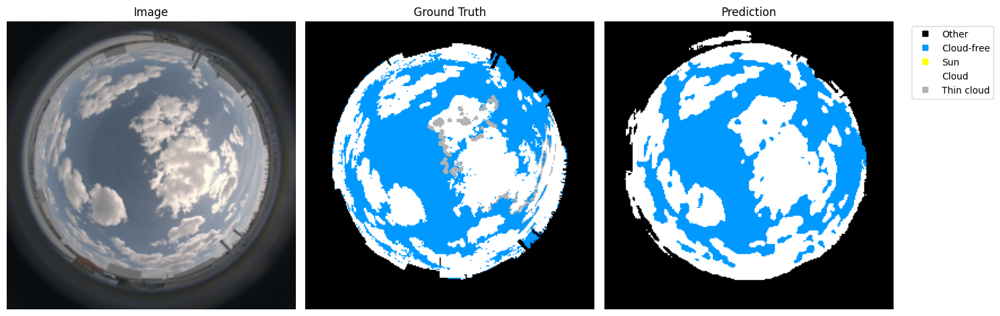

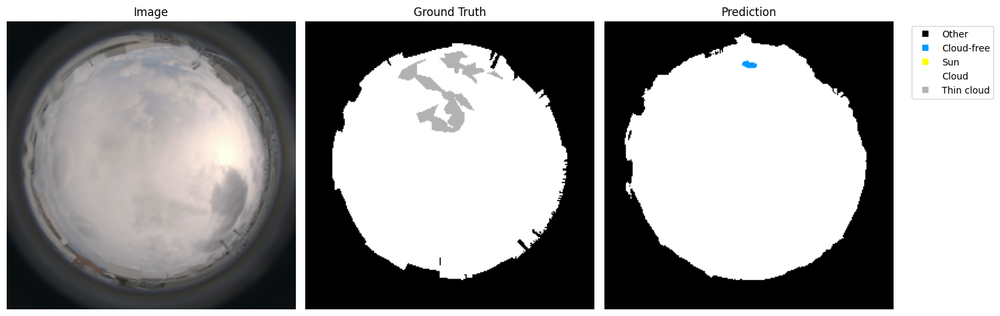

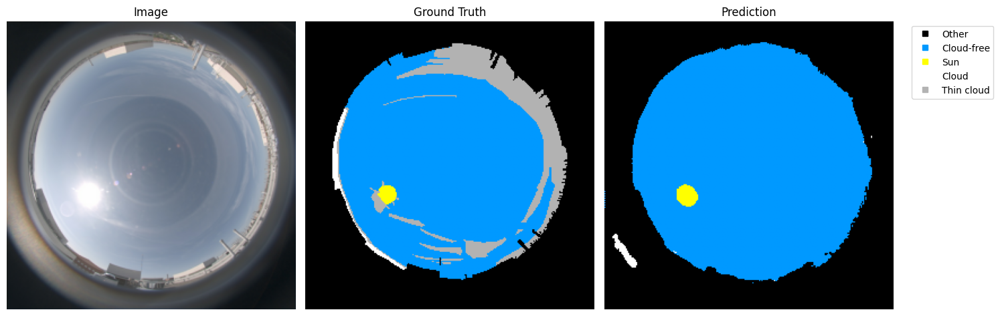

...

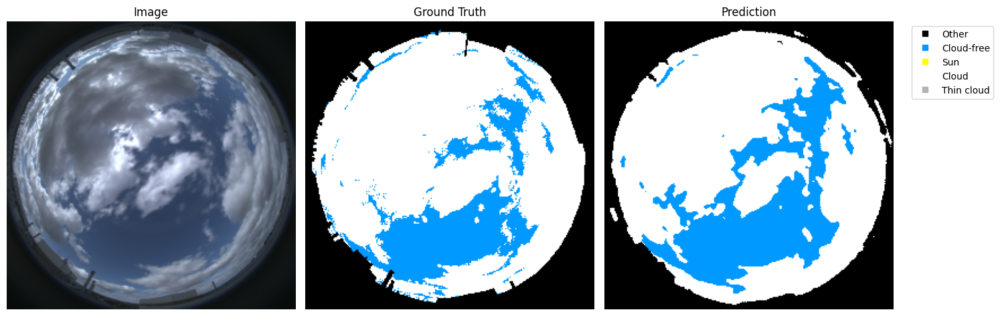

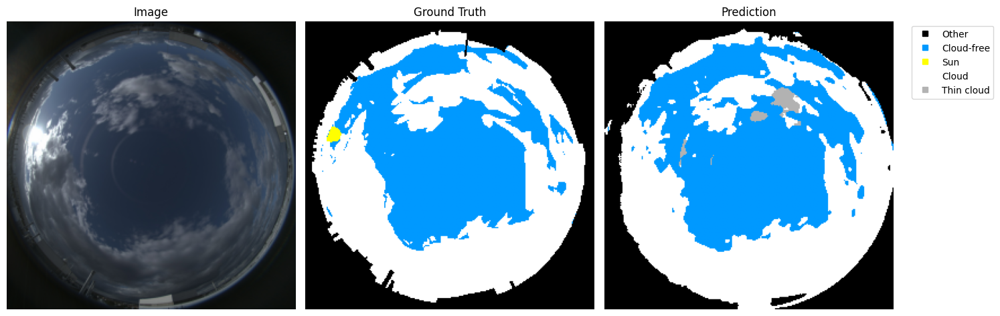

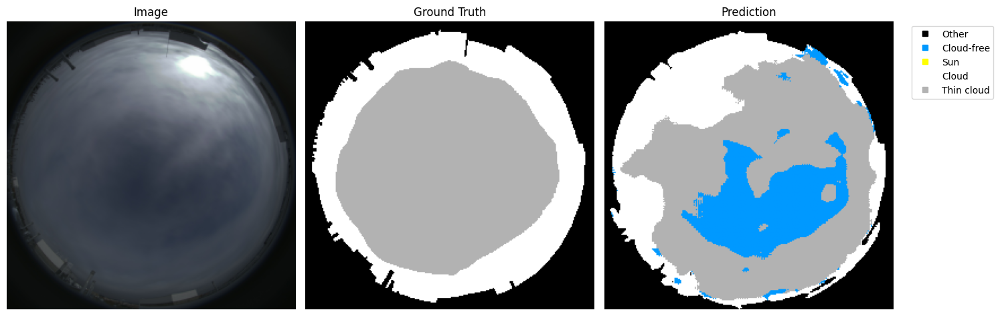

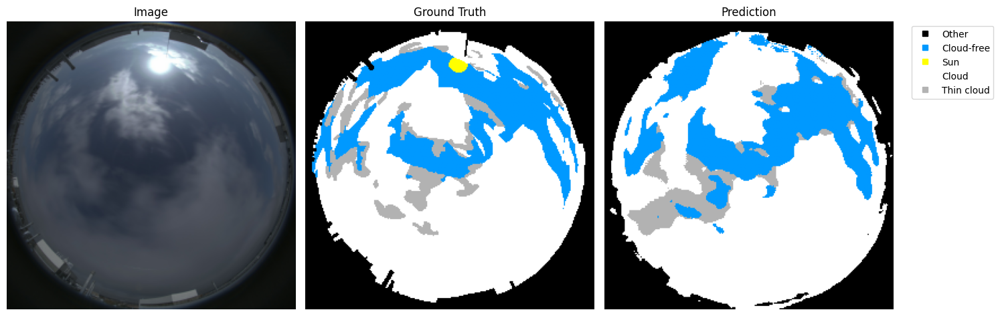

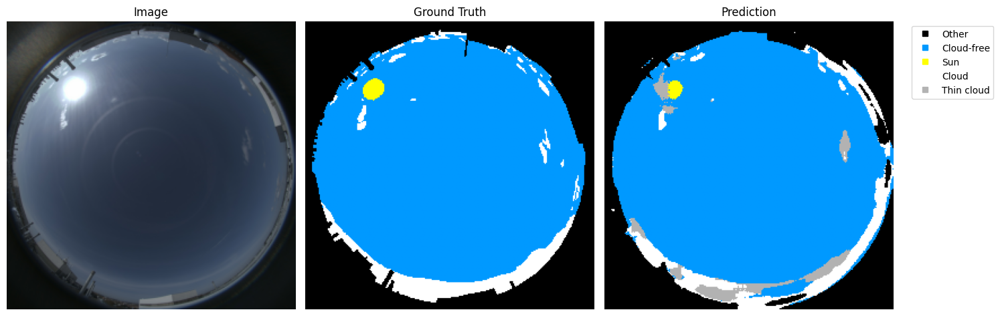

{'scce': 0.5749710040787855, 'miou': <tf.Tensor: shape=(), dtype=float32, numpy=0.5869538>, 'mdice': <tf.Tensor: shape=(), dtype=float32, numpy=0.67082864>, 'mprecision': <tf.Tensor: shape=(), dtype=float32, numpy=0.7686778>, 'mrecall': <tf.Tensor: shape=(), dtype=float32, numpy=0.6997094>, 'iou_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.91352445, 0.6856906 , 0.5686831 , 0.6164506 , 0.15042067],
      dtype=float32)>, 'dice_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.95464236, 0.7790752 , 0.651482  , 0.7364638 , 0.23247986],
      dtype=float32)>, 'cce_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.2569036 , 0.37885284, 1.8445816 , 0.5653646 , 3.1956108 ],
      dtype=float32)>}


In [43]:
NUM_CLASSES = 5
CLASS_NAMES = ["Other", "Cloud-free", "Sun", "Cloud", "Thin cloud"]

scce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

tot_loss = 0.0
tot = {"miou":0.0, "mdice":0.0, "mprecision":0.0, "mrecall":0.0, "iou_per_class": 0, "dice_per_class": 0.0, "cce_per_class": 0.0}
n = 0

cm = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)  # (true, pred)

for imgs, masks in dataset:
    y_true = tf.squeeze(tf.cast(masks, tf.int32), axis=-1)   # [B,H,W]
    y_pred = cloud_segmenter(imgs)         # [B,H,W,5]

    loss = scce(y_true, y_pred)
    m = multiclass_metrics(y_true, y_pred, num_classes=5)
    tot_loss += float(loss)
    for k in tot: tot[k] += m[k]
    n += 1

    y_pred_cls = tf.argmax(y_pred, axis=-1, output_type=tf.int32)  # [B,H,W]
    yt = tf.reshape(y_true, [-1])
    yp = tf.reshape(y_pred_cls, [-1])
    batch_cm = tf.math.confusion_matrix(yt, yp, num_classes=NUM_CLASSES)
    cm += batch_cm.numpy()

    for i in range(len(imgs)):
        plot_sample(imgs[i]/256, masks[i], y_pred_cls[i])

print({
    "scce": tot_loss / n,
    **{k: tot[k]/n for k in tot}
})


## Show results

In [31]:
def plot_conf_matrix(cm, classes, title, ax, normalize_axis=None):
    if normalize_axis is not None:
        cm = cm.astype('float') / cm.sum(axis=normalize_axis, keepdims=True)
        cm = np.nan_to_num(cm)
    sns.heatmap(cm, annot=True, fmt=".2f", cmap='YlGnBu', xticklabels=classes, yticklabels=classes, square=True, cbar=True, ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Ground Truth')
    ax.set_title(title)

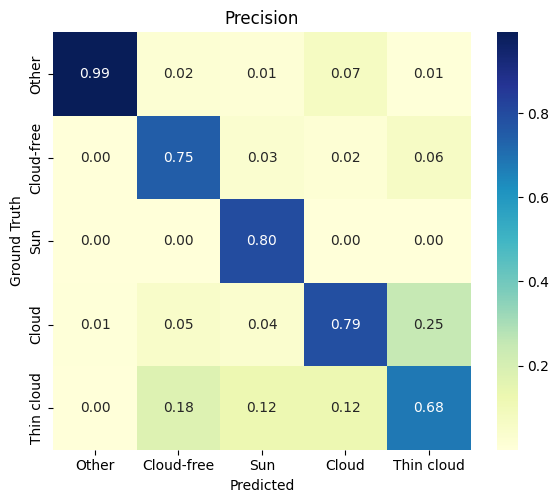

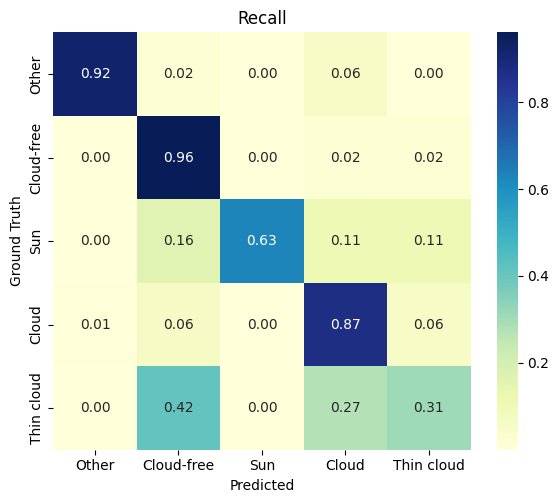

In [32]:
fig, ax = plt.subplots(figsize=(6, 5))
plot_conf_matrix(cm, CLASS_NAMES, "Precision", ax, normalize_axis=0)
plt.tight_layout()
plt.show()
fig, ax = plt.subplots(figsize=(6, 5))
plot_conf_matrix(cm, CLASS_NAMES, "Recall", ax, normalize_axis=1)
plt.tight_layout()
plt.show()

In [ ]:
metrics = {k: tot[k]/n for k in ["iou_per_class", "dice_per_class", "cce_per_class"]}

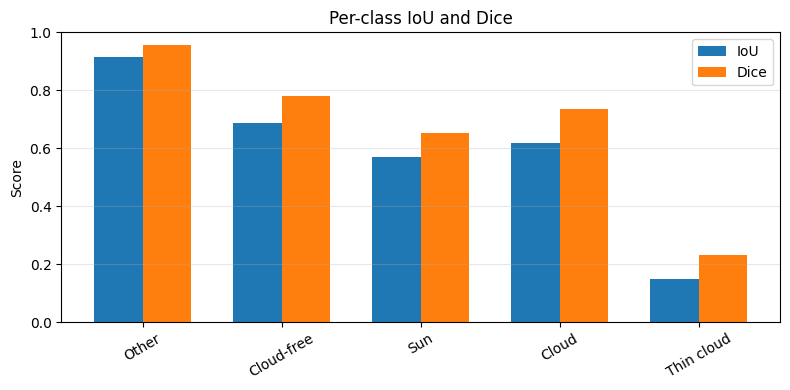

In [50]:
x = np.arange(len(CLASS_NAMES))
width = 0.35

plt.figure(figsize=(8, 4))
plt.bar(x - width/2, metrics["iou_per_class"], width, label="IoU")
plt.bar(x + width/2, metrics["dice_per_class"], width, label="Dice")

plt.xticks(x, CLASS_NAMES, rotation=30)
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Per-class IoU and Dice")
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


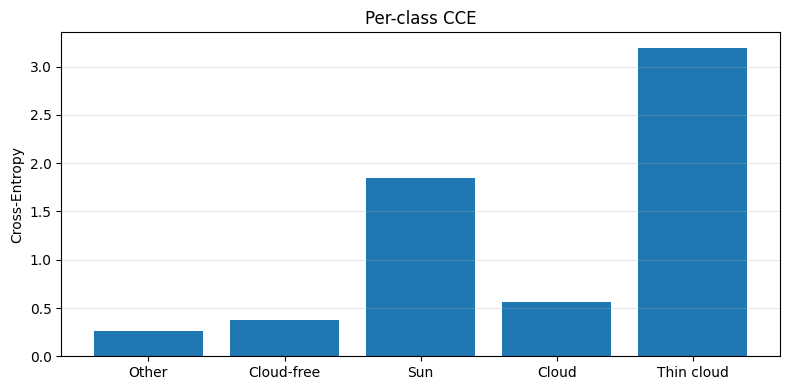

In [53]:
plt.figure(figsize=(8, 4))
plt.bar(CLASS_NAMES, metrics["cce_per_class"])
plt.ylabel("Cross-Entropy")
plt.title("Per-class CCE")
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()


# Analyze reducing

## New Dataloader

In [33]:
pairloader64 = PairLoader(img_folder, mask_folder, prereduction=(64, 64))

In [34]:
dataset64 = tf.data.Dataset.from_tensor_slices(list(zip(names, namesmask)))
dataset64 = dataset64.map(pairloader64.load_pair).batch(4)

## Compute

In [54]:
NUM_CLASSES = 5
CLASS_NAMES = ["Other", "Cloud-free", "Sun", "Cloud", "Thin cloud"]

scce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)

tot_loss64 = 0.0
tot64 = {"miou":0.0, "mdice":0.0, "mprecision":0.0, "mrecall":0.0, "iou_per_class": 0, "dice_per_class": 0.0, "cce_per_class": 0.0}
n = 0

cm64 = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)  # (true, pred)

for imgs, masks in dataset64:
    y_true = tf.squeeze(tf.cast(masks, tf.int32), axis=-1)   # [B,H,W]
    y_pred = cloud_segmenter(imgs)         # [B,H,W,5]

    loss = scce(y_true, y_pred)
    m = multiclass_metrics(y_true, y_pred, num_classes=5)
    tot_loss64 += float(loss)
    for k in tot64: tot64[k] += m[k]
    n += 1

    y_pred_cls = tf.argmax(y_pred, axis=-1, output_type=tf.int32)  # [B,H,W]
    yt = tf.reshape(y_true, [-1])
    yp = tf.reshape(y_pred_cls, [-1])
    batch_cm = tf.math.confusion_matrix(yt, yp, num_classes=NUM_CLASSES)
    cm64 += batch_cm.numpy()

print({
    "scce": tot_loss64 / n,
    **{k: tot64[k]/n for k in tot64}
})


{'scce': 0.6344347447156906, 'miou': <tf.Tensor: shape=(), dtype=float32, numpy=0.57427883>, 'mdice': <tf.Tensor: shape=(), dtype=float32, numpy=0.6624217>, 'mprecision': <tf.Tensor: shape=(), dtype=float32, numpy=0.73172265>, 'mrecall': <tf.Tensor: shape=(), dtype=float32, numpy=0.6883033>, 'iou_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.88895625, 0.678725  , 0.5601024 , 0.59062606, 0.15298429],
      dtype=float32)>, 'dice_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.9409816 , 0.7741516 , 0.6465562 , 0.7126542 , 0.23776494],
      dtype=float32)>, 'cce_per_class': <tf.Tensor: shape=(5,), dtype=float32, numpy=
array([0.3476757 , 0.45186433, 1.641038  , 0.6313245 , 3.2553613 ],
      dtype=float32)>}


## Show results

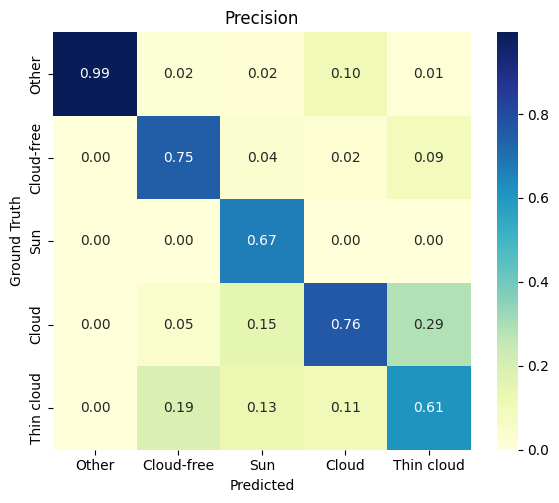

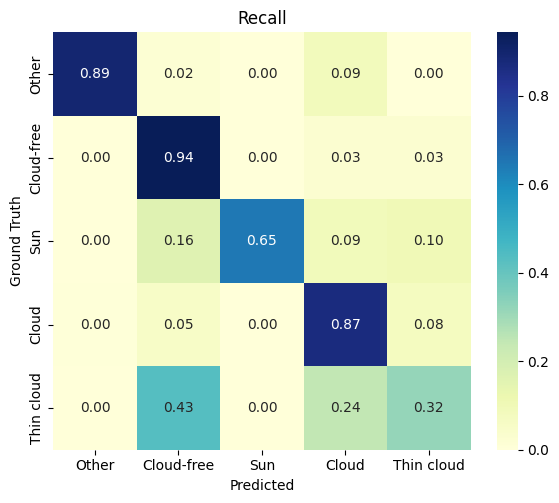

In [55]:
fig, ax = plt.subplots(figsize=(6, 5))
plot_conf_matrix(cm64, CLASS_NAMES, "Precision", ax, normalize_axis=0)
plt.tight_layout()
plt.show()
fig, ax = plt.subplots(figsize=(6, 5))
plot_conf_matrix(cm64, CLASS_NAMES, "Recall", ax, normalize_axis=1)
plt.tight_layout()
plt.show()

In [56]:
metrics64 = {k: tot64[k]/n for k in ["iou_per_class", "dice_per_class", "cce_per_class"]}

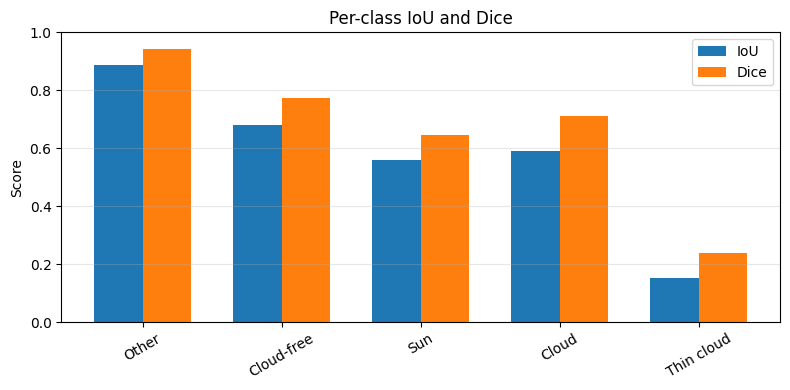

In [57]:
x = np.arange(len(CLASS_NAMES))
width = 0.35

plt.figure(figsize=(8, 4))
plt.bar(x - width/2, metrics64["iou_per_class"], width, label="IoU")
plt.bar(x + width/2, metrics64["dice_per_class"], width, label="Dice")

plt.xticks(x, CLASS_NAMES, rotation=30)
plt.ylim(0, 1)
plt.ylabel("Score")
plt.title("Per-class IoU and Dice")
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.tight_layout()
plt.show()